<a href="https://www.kaggle.com/code/ghassenkhaled/data-preparation-and-customer-analytics?scriptVersionId=119595228" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

#  Task 1
# Data Preparation and customer analysis

In [1]:
#imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.offline as offline
offline.init_notebook_mode()
import cufflinks as cf
cf.go_offline()

/opt/conda/lib/python3.7/site-packages/geopandas/_compat.py:115: UserWarning:

The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.



In [3]:
#reading data
purchase=pd.read_csv("/kaggle/input/quantium-analytics-and-commercial-application/QVI_purchase_behaviour.csv");
purchase.head(2)

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER
0,1000,YOUNG SINGLES/COUPLES,Premium
1,1002,YOUNG SINGLES/COUPLES,Mainstream


In [4]:
transaction=pd.read_excel("/kaggle/input/quantium-analytics-and-commercial-application/QVI_transaction_data.xlsx")
transaction.head(2)

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,43390,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,43599,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3


# Transaction

In [5]:
#transforming date column
transaction["DATE"]=pd.to_datetime(transaction["DATE"], origin = "1899-12-30",unit="D")

In [6]:
transaction["PROD_NAME"].describe()

count                                     264836
unique                                       114
top       Kettle Mozzarella   Basil & Pesto 175g
freq                                        3304
Name: PROD_NAME, dtype: object

In [7]:
#finding the most frequest words
import collections
freq=collections.Counter([j  for s in transaction["PROD_NAME"] for j in s.split()])

In [8]:
#sorting in decreasing order of the frequency of words
fre=pd.DataFrame([freq.keys(),freq.values()],index=['Word','Frequency']).transpose().sort_values(by='Frequency',ascending=False)

In [9]:
# removing useless words like '170g'
fre=fre[[ s[0] not in  ['0','1','2','3','4','5','6','7','8','9','&'] for s in fre['Word'] ]]
# most frequent words
fre.head()

,Word,Frequency
11,Chips,49770
16,Kettle,41288
8,Smiths,28860
29,Salt,27976
6,Cheese,27890


In [10]:
#dropping salsa items
transaction.drop(transaction[[("Salsa" in s)  for s in transaction['PROD_NAME']]].index,inplace=True)

In [11]:
transaction[[("Salsa" in s)  for s in transaction['PROD_NAME']]]

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES


In [12]:
#details about transaction dataset

In [13]:
transaction.describe()

,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_QTY,TOT_SALES
count,246742.000000,2.467420e+05,2.467420e+05,246742.000000,246742.000000,246742.000000
mean,135.051098,1.355310e+05,1.351311e+05,56.351789,1.908062,7.321322
std,76.787096,8.071528e+04,7.814772e+04,33.695428,0.659831,3.077828
min,1.000000,1.000000e+03,1.000000e+00,1.000000,1.000000,1.700000
25%,70.000000,7.001500e+04,6.756925e+04,26.000000,2.000000,5.800000
50%,130.000000,1.303670e+05,1.351830e+05,53.000000,2.000000,7.400000
75%,203.000000,2.030840e+05,2.026538e+05,87.000000,2.000000,8.800000
max,272.000000,2.373711e+06,2.415841e+06,114.000000,200.000000,650.000000


In [14]:
transaction.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 246742 entries, 0 to 264835
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   DATE            246742 non-null  datetime64[ns]
 1   STORE_NBR       246742 non-null  int64         
 2   LYLTY_CARD_NBR  246742 non-null  int64         
 3   TXN_ID          246742 non-null  int64         
 4   PROD_NBR        246742 non-null  int64         
 5   PROD_NAME       246742 non-null  object        
 6   PROD_QTY        246742 non-null  int64         
 7   TOT_SALES       246742 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(5), object(1)
memory usage: 16.9+ MB


In [15]:
#number of nulls in each column
transaction.isna().sum()

DATE              0
STORE_NBR         0
LYLTY_CARD_NBR    0
TXN_ID            0
PROD_NBR          0
PROD_NAME         0
PROD_QTY          0
TOT_SALES         0
dtype: int64

## Removing anomalies

In [16]:
#product quantity

In [17]:
transaction['PROD_QTY'].describe()

count    246742.000000
mean          1.908062
std           0.659831
min           1.000000
25%           2.000000
50%           2.000000
75%           2.000000
max         200.000000
Name: PROD_QTY, dtype: float64

In [18]:
transaction[transaction['PROD_QTY']>5]

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
69762,2018-08-19,226,226000,226201,4,Dorito Corn Chp Supreme 380g,200,650.0
69763,2019-05-20,226,226000,226210,4,Dorito Corn Chp Supreme 380g,200,650.0


In [19]:
transaction.drop(labels=transaction[transaction['PROD_QTY']==200].index,inplace=True)
#transaction.drop(labels=transaction[transaction['TOT_SALES']>600].index,inplace=True)
#transaction.drop(labels=transaction[transaction['TXN_ID']>1500000].index,inplace=True)

In [20]:
#missing dates

In [21]:
ts=transaction.groupby('DATE').count()
ts.head()

,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
DATE,,,,,,,
2018-07-01,663,663,663,663,663,663,663
2018-07-02,650,650,650,650,650,650,650
2018-07-03,674,674,674,674,674,674,674
2018-07-04,669,669,669,669,669,669,669
2018-07-05,660,660,660,660,660,660,660


In [22]:
#missing date 
set(pd.date_range('2018-07-01', end='2019-06-30',freq='D'))-set((ts.index))

{Timestamp('2018-12-25 00:00:00', freq='D')}

In [23]:
ts.loc['2018-12-25']=np.nan#=ts.mean().apply(int)

In [24]:
ts[ts.index=='2018-12-25']

,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
DATE,,,,,,,
2018-12-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [25]:
#plot showing missing date
ts['TXN_ID'].iplot(kind='bar',xTitle='Day',yTitle= "Number of transactions", title = "Transactions over time")

In [26]:
#Adding features

In [27]:
def fun(s):
    a=[]
    for i in s:
        if i in ['0','1','2','3','4','5','6','7','8','9']:
            a.append(i)
    return int("".join(a))

In [28]:
transaction['PACKAGE_SIZE']=transaction['PROD_NAME'].apply(fun)
transaction.head(5)

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PACKAGE_SIZE
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0,175
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0,175
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8,150


In [29]:
transaction['BRAND']=[s.split()[0] for s in transaction['PROD_NAME']]
transaction['BRAND'].replace('Dorito','Doritos',inplace=True)
transaction['BRAND'].replace('Infzns','Infuzions',inplace=True)
transaction['BRAND'].replace('Smith','Smiths',inplace=True)
transaction['BRAND'].replace('Snbts','Sunbites',inplace=True)
transaction['BRAND'].replace('Red','RRD',inplace=True)
transaction['BRAND'].replace('Old','Old El Paso',inplace=True)
transaction['BRAND'].replace('WW','Woolworths',inplace=True)
transaction['BRAND'].replace('Natural','NCC',inplace=True)

In [30]:
#Histogram for brands
transaction['BRAND'].iplot(kind='hist',xTitle='Brand',yTitle='Packets sold',title='Popular brands')

<AxesSubplot:xlabel='PACKAGE_SIZE', ylabel='BRAND'>

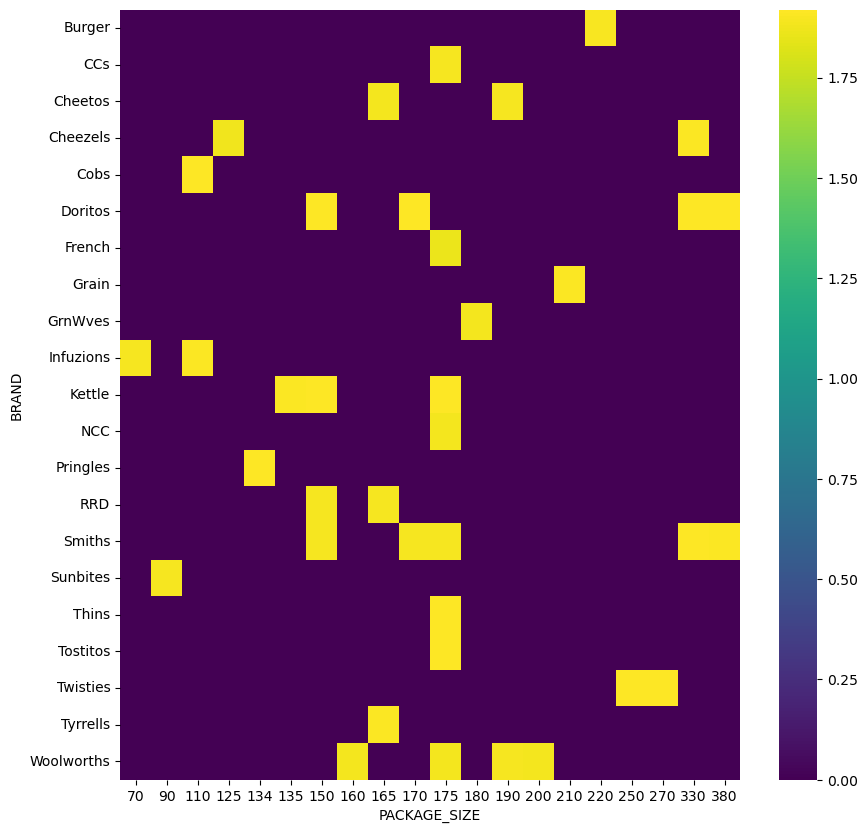

In [31]:
#heatmap showing packet quantity mostly bought according to brand and packet size
plt.figure(figsize=(10,10))
sns.heatmap(pd.pivot_table(data=transaction,index='BRAND',columns='PACKAGE_SIZE',values='PROD_QTY').fillna(0),cmap='viridis')

<AxesSubplot:ylabel='count'>

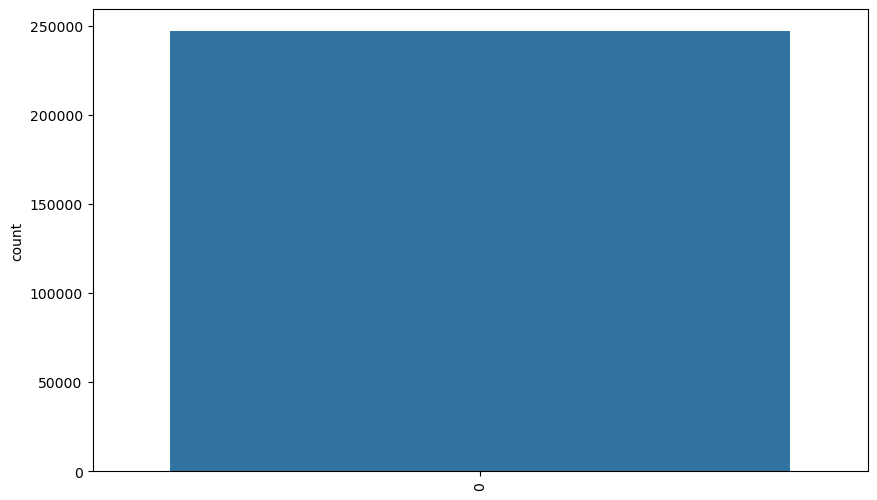

In [32]:
#histogram of packet size
plt.figure(figsize=(10,6))
plt.xticks(rotation=90)
sns.countplot(transaction['PACKAGE_SIZE'])

<AxesSubplot:>

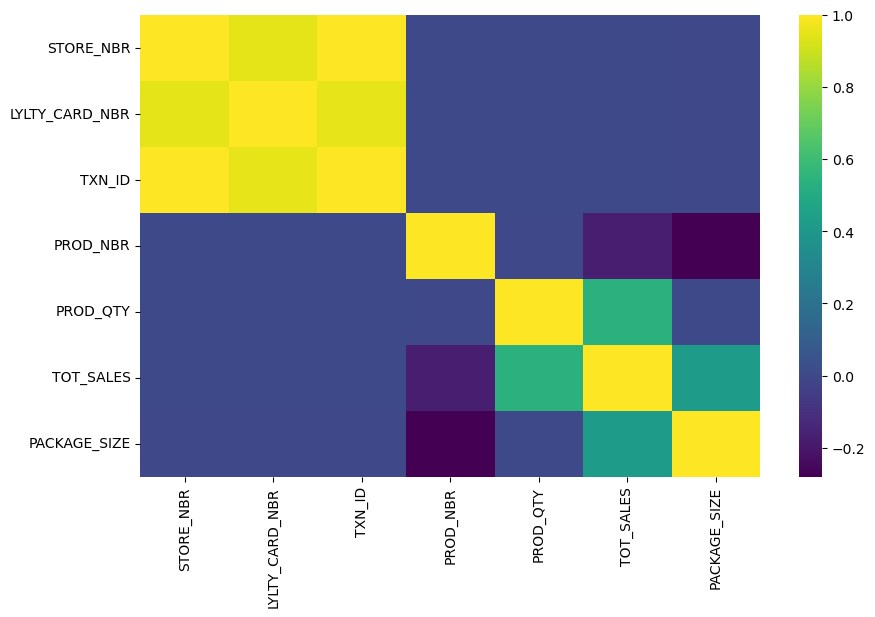

In [33]:
#correlation heatmap
plt.figure(figsize=(10,6))
sns.heatmap(transaction.corr(),cmap='viridis')

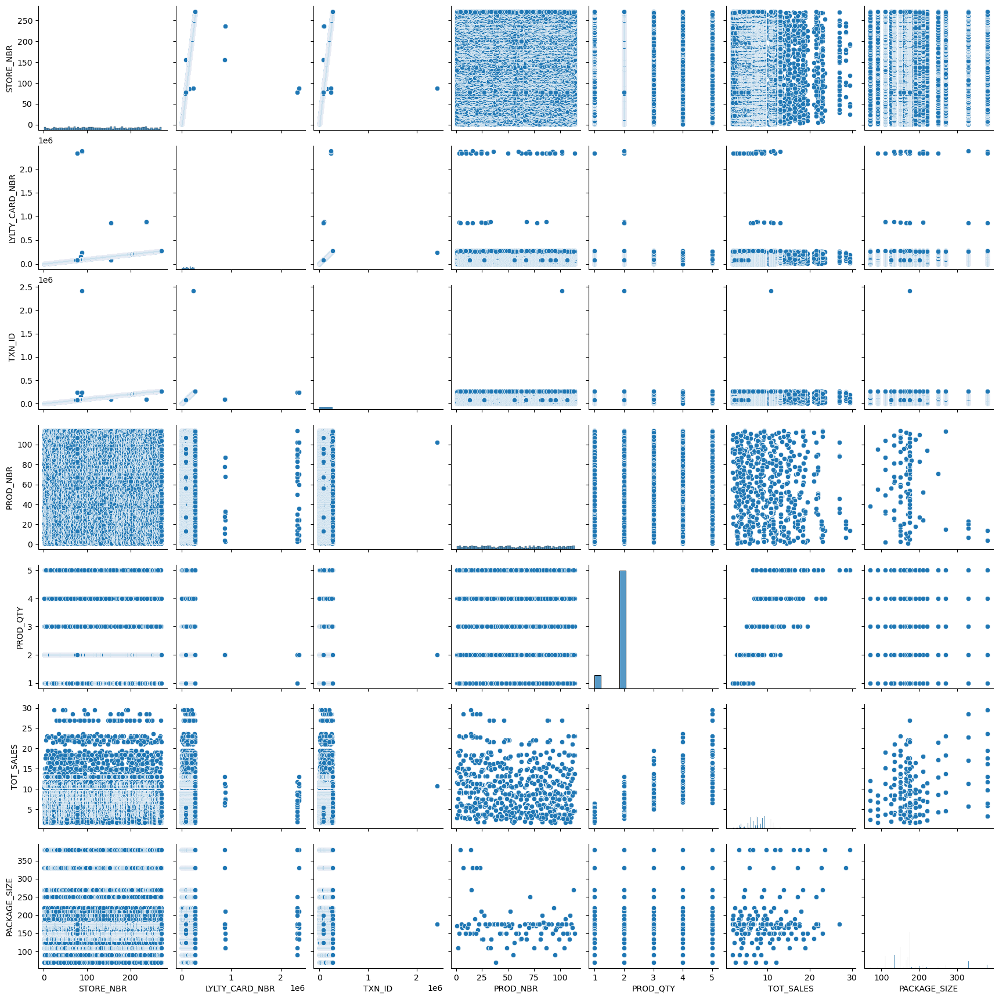

In [34]:
#pairplot
sns.pairplot(data=transaction[transaction.columns.drop('PROD_NAME')])

# Purchase

In [35]:
purchase.head(3)

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER
0,1000,YOUNG SINGLES/COUPLES,Premium
1,1002,YOUNG SINGLES/COUPLES,Mainstream
2,1003,YOUNG FAMILIES,Budget


In [36]:
purchase['LYLTY_CARD_NBR'].nunique()

72637

In [37]:
purchase.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72637 entries, 0 to 72636
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   LYLTY_CARD_NBR    72637 non-null  int64 
 1   LIFESTAGE         72637 non-null  object
 2   PREMIUM_CUSTOMER  72637 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.7+ MB


In [38]:
purchase.describe(include='all')

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER
count,7.263700e+04,72637,72637
unique,NaN,7,3
top,NaN,RETIREES,Mainstream
freq,NaN,14805,29245
mean,1.361859e+05,NaN,NaN
std,8.989293e+04,NaN,NaN
min,1.000000e+03,NaN,NaN
25%,6.620200e+04,NaN,NaN
50%,1.340400e+05,NaN,NaN
75%,2.033750e+05,NaN,NaN


In [39]:
#lifestage distribution among customers
purchase['LIFESTAGE'].iplot(kind='hist')

In [40]:
#Premium customer distribution among customers
purchase['PREMIUM_CUSTOMER'].iplot(kind='hist')

In [41]:
purchase.isna().sum()

LYLTY_CARD_NBR      0
LIFESTAGE           0
PREMIUM_CUSTOMER    0
dtype: int64

# joining datasets

In [42]:
finaldf=pd.merge(transaction,purchase,on='LYLTY_CARD_NBR')
finaldf.head(2)

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PACKAGE_SIZE,BRAND,LIFESTAGE,PREMIUM_CUSTOMER
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0,175,NCC,YOUNG SINGLES/COUPLES,Premium
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175,CCs,MIDAGE SINGLES/COUPLES,Budget


In [43]:
finaldf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 246740 entries, 0 to 246739
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   DATE              246740 non-null  datetime64[ns]
 1   STORE_NBR         246740 non-null  int64         
 2   LYLTY_CARD_NBR    246740 non-null  int64         
 3   TXN_ID            246740 non-null  int64         
 4   PROD_NBR          246740 non-null  int64         
 5   PROD_NAME         246740 non-null  object        
 6   PROD_QTY          246740 non-null  int64         
 7   TOT_SALES         246740 non-null  float64       
 8   PACKAGE_SIZE      246740 non-null  int64         
 9   BRAND             246740 non-null  object        
 10  LIFESTAGE         246740 non-null  object        
 11  PREMIUM_CUSTOMER  246740 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(6), object(4)
memory usage: 24.5+ MB


In [44]:
finaldf.isna().sum()

DATE                0
STORE_NBR           0
LYLTY_CARD_NBR      0
TXN_ID              0
PROD_NBR            0
PROD_NAME           0
PROD_QTY            0
TOT_SALES           0
PACKAGE_SIZE        0
BRAND               0
LIFESTAGE           0
PREMIUM_CUSTOMER    0
dtype: int64

In [45]:
finaldf.to_csv('Final.csv')

In [46]:
finaldf[['TOT_SALES','PREMIUM_CUSTOMER']].groupby('PREMIUM_CUSTOMER').sum().sort_values('TOT_SALES',ascending=False)

,TOT_SALES
PREMIUM_CUSTOMER,
Mainstream,700865.40
Budget,631406.85
Premium,472905.45


In [47]:
#Who spends the most on chips (total sales), describing customers by lifestage and
#how premium their general purchasing behaviour is
a=finaldf[['LIFESTAGE','PREMIUM_CUSTOMER','TOT_SALES']].groupby(['PREMIUM_CUSTOMER','LIFESTAGE']).sum()
a.sort_values('TOT_SALES',ascending=False)

TOT_SALES
PREMIUM_CUSTOMER LIFESTAGE                        
Budget           OLDER FAMILIES          156863.75
Mainstream       YOUNG SINGLES/COUPLES   147582.20
                 RETIREES                145168.95
Budget           YOUNG FAMILIES          129717.95
                 OLDER SINGLES/COUPLES   127833.60
Mainstream       OLDER SINGLES/COUPLES   124648.50
Premium          OLDER SINGLES/COUPLES   123537.55
Budget           RETIREES                105916.30
Mainstream       OLDER FAMILIES           96413.55
Premium          RETIREES                 91296.65
Mainstream       YOUNG FAMILIES           86338.25
                 MIDAGE SINGLES/COUPLES   84734.25
Premium          YOUNG FAMILIES           78571.70
                 OLDER FAMILIES           75242.60
Budget           YOUNG SINGLES/COUPLES    57122.10
Premium          MIDAGE SINGLES/COUPLES   54443.85
                 YOUNG SINGLES/COUPLES    39052.30
Budget           MIDAGE SINGLES/COUPLES   33345.70
                 NEW FAMILIES             20607.45
Mainstream       NEW FAMILIES             15979.70
Premium          NEW FAMILIES             10760.80

<AxesSubplot:xlabel='LIFESTAGE', ylabel='TOT_SALES'>

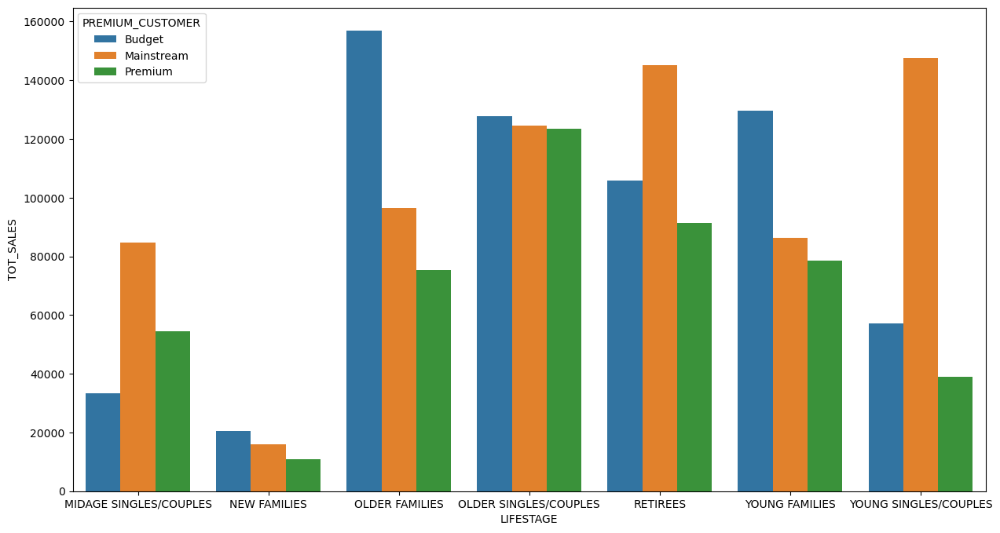

In [48]:
plt.figure(figsize=(15,8))
sns.barplot(y=a.reset_index()['TOT_SALES'],x=a.reset_index()['LIFESTAGE'],hue=a.reset_index()['PREMIUM_CUSTOMER'])

In [49]:
a.iplot(title="Sales per segment",yTitle='Total sales',xTitle='Segment')

In [50]:
# How many customers are in each segment
b=purchase.groupby(['PREMIUM_CUSTOMER','LIFESTAGE']).count()
b.columns=['CUSTOMER_COUNT']
b.sort_values('CUSTOMER_COUNT',ascending=False)

CUSTOMER_COUNT
PREMIUM_CUSTOMER LIFESTAGE                             
Mainstream       YOUNG SINGLES/COUPLES             8088
                 RETIREES                          6479
                 OLDER SINGLES/COUPLES             4930
Budget           OLDER SINGLES/COUPLES             4929
Premium          OLDER SINGLES/COUPLES             4750
Budget           OLDER FAMILIES                    4675
                 RETIREES                          4454
                 YOUNG FAMILIES                    4017
Premium          RETIREES                          3872
Budget           YOUNG SINGLES/COUPLES             3779
Mainstream       MIDAGE SINGLES/COUPLES            3340
                 OLDER FAMILIES                    2831
                 YOUNG FAMILIES                    2728
Premium          YOUNG SINGLES/COUPLES             2574
                 YOUNG FAMILIES                    2433
                 MIDAGE SINGLES/COUPLES            2431
                 OLDER FAMILIES                    2274
Budget           MIDAGE SINGLES/COUPLES            1504
                 NEW FAMILIES                      1112
Mainstream       NEW FAMILIES                       849
Premium          NEW FAMILIES                       588

In [51]:
b.iplot(title="Number of customers per segment",yTitle='No of Customers',xTitle='Segment')

In [52]:
#  This contributes to there being more sales to these customer segments but
# this is not a major driver for the Budget - Older families segment.
# Higher sales may also be driven by more units of chips being bought per customer. 

In [53]:
#How many chips are bought per customer by segment
c=finaldf[['LIFESTAGE','PREMIUM_CUSTOMER','TOT_SALES']].groupby(['LIFESTAGE','PREMIUM_CUSTOMER']).count()
c.sort_values('TOT_SALES',ascending=False).head(5)

,,TOT_SALES
LIFESTAGE,PREMIUM_CUSTOMER,
OLDER FAMILIES,Budget,21514
RETIREES,Mainstream,19970
YOUNG SINGLES/COUPLES,Mainstream,19544
YOUNG FAMILIES,Budget,17763
OLDER SINGLES/COUPLES,Budget,17172


In [54]:
c.iplot(title="Number of packets sold per segment",yTitle='No of Packets',xTitle='Segment')

In [55]:
#  The customer's total spend over the period        
# to understand what proportion of their grocery spend is on chips 
transaction1=pd.read_excel("/kaggle/input/quantium-analytics-and-commercial-application/QVI_transaction_data.xlsx")
totsalespercust=transaction1[['LYLTY_CARD_NBR','TOT_SALES']].groupby(['LYLTY_CARD_NBR']).sum().reset_index()
ratio=finaldf[['LYLTY_CARD_NBR','TOT_SALES']].merge(totsalespercust,on='LYLTY_CARD_NBR').rename(columns={'TOT_SALES_x':'TRAN_SALE','TOT_SALES_y':'CUST_TOT_SALE'})
ratio['RATIO']=ratio['TRAN_SALE']/ratio['CUST_TOT_SALE']
ratio.sort_values('RATIO')

,LYLTY_CARD_NBR,TRAN_SALE,CUST_TOT_SALE,RATIO
174208,152094,1.9,112.1,0.016949
75460,48155,1.9,100.7,0.018868
174557,168140,1.7,86.5,0.019653
16284,104061,1.7,85.9,0.019790
30772,55244,1.7,85.7,0.019837
...,...,...,...,...
163956,49312,11.4,11.4,1.000000
163855,47486,7.4,7.4,1.000000
163852,47465,10.8,10.8,1.000000
162683,12139,8.6,8.6,1.000000


In [56]:
#  Proportion of customers in each customer segment overall to compare against the
# mix of customers who purchase chips
e=finaldf[['LIFESTAGE','PREMIUM_CUSTOMER','TOT_SALES']].groupby(['PREMIUM_CUSTOMER','LIFESTAGE']).count()
e["TOT_SALES"]/(e['TOT_SALES'].sum())

PREMIUM_CUSTOMER  LIFESTAGE             
Budget            MIDAGE SINGLES/COUPLES    0.019012
                  NEW FAMILIES              0.011445
                  OLDER FAMILIES            0.087193
                  OLDER SINGLES/COUPLES     0.069596
                  RETIREES                  0.057652
                  YOUNG FAMILIES            0.071991
                  YOUNG SINGLES/COUPLES     0.034745
Mainstream        MIDAGE SINGLES/COUPLES    0.044966
                  NEW FAMILIES              0.008855
                  OLDER FAMILIES            0.053664
                  OLDER SINGLES/COUPLES     0.069146
                  RETIREES                  0.080935
                  YOUNG FAMILIES            0.048419
                  YOUNG SINGLES/COUPLES     0.079209
Premium           MIDAGE SINGLES/COUPLES    0.030850
                  NEW FAMILIES              0.006031
                  OLDER FAMILIES            0.042162
                  OLDER SINGLES/COUPLES     0.067115
     

In [57]:
# What's the average chip price by customer segment
finaldf['CHIP_PRICE']=finaldf['TOT_SALES']/finaldf['PROD_QTY']
d=finaldf[['LIFESTAGE','PREMIUM_CUSTOMER','CHIP_PRICE']].groupby(['PREMIUM_CUSTOMER','LIFESTAGE']).mean()
d.sort_values("CHIP_PRICE",ascending=False)

CHIP_PRICE
PREMIUM_CUSTOMER LIFESTAGE                         
Mainstream       YOUNG SINGLES/COUPLES     4.065642
                 MIDAGE SINGLES/COUPLES    3.994241
Budget           RETIREES                  3.924404
Premium          RETIREES                  3.920942
Budget           NEW FAMILIES              3.917688
Mainstream       NEW FAMILIES              3.916133
Premium          OLDER SINGLES/COUPLES     3.893182
Budget           OLDER SINGLES/COUPLES     3.882096
Premium          NEW FAMILIES              3.872110
Mainstream       RETIREES                  3.844294
                 OLDER SINGLES/COUPLES     3.814665
Premium          MIDAGE SINGLES/COUPLES    3.770698
                 YOUNG FAMILIES            3.762150
Budget           YOUNG FAMILIES            3.760737
                 OLDER FAMILIES            3.745340
                 MIDAGE SINGLES/COUPLES    3.743328
Mainstream       OLDER FAMILIES            3.737077
                 YOUNG FAMILIES            3.724533
Premium          OLDER FAMILIES            3.717000
                 YOUNG SINGLES/COUPLES     3.665414
Budget           YOUNG SINGLES/COUPLES     3.657366

In [58]:
d.iplot(title="Avg pay per packet per segment",yTitle='Avg Payment',xTitle='Segment')

In [59]:
#t-test

In [60]:
from scipy import stats
#Mainstream vs premium
stats.ttest_ind([4.065642,3.994241],[3.770698,3.665414])

Ttest_indResult(statistic=4.903408005498769, pvalue=0.039164352682153285)

In [61]:
#Mainstream vs budget
stats.ttest_ind([4.065642,3.994241],[3.657366,3.743328])

Ttest_indResult(statistic=5.898899732826305, pvalue=0.027555775534860754)

In [62]:
# The t-test results in a p-value of 0.03 and 0.02 , i.e. the unit price for mainstream,
# young and mid-age singles and couples ARE significantly higher than
# that of budget or premium, young and midage singles and couples.

In [63]:
#Now we are focussing on the mainstream, young and mid-age singles and couples
# brands that these two customer segments prefer more than others

In [64]:
midage=finaldf[(finaldf['PREMIUM_CUSTOMER']=='Mainstream') & (finaldf['LIFESTAGE']=='MIDAGE SINGLES/COUPLES')]
young=finaldf[(finaldf['PREMIUM_CUSTOMER']=='Mainstream') & (finaldf['LIFESTAGE']=='YOUNG SINGLES/COUPLES')]
print(f"MIDAGE SINGLES/COUPLES\n{midage['BRAND'].value_counts().head(5)}")
print(f"YOUNG SINGLES/COUPLES\n{young['BRAND'].value_counts().head(5)}")

MIDAGE SINGLES/COUPLES
Kettle       2136
Smiths       1276
Doritos      1210
Pringles     1159
Infuzions     679
Name: BRAND, dtype: int64
YOUNG SINGLES/COUPLES
Kettle       3844
Doritos      2379
Pringles     2315
Smiths       1921
Infuzions    1250
Name: BRAND, dtype: int64


In [65]:
#Kettle, Smiths and Doritos are popular among MIDAGE and Kettle, Pringles and Doritos are popular among YOUNG

In [66]:
print(f"MIDAGE SINGLES/COUPLES\n{midage['PACKAGE_SIZE'].value_counts().head(5)}")
print(f"YOUNG SINGLES/COUPLES\n{young['PACKAGE_SIZE'].value_counts().head(5)}")

MIDAGE SINGLES/COUPLES
175    2975
150    1777
134    1159
110    1124
170     882
Name: PACKAGE_SIZE, dtype: int64
YOUNG SINGLES/COUPLES
175    4997
150    3080
134    2315
110    2051
170    1575
Name: PACKAGE_SIZE, dtype: int64


In [67]:
#both the segments buy 175g,150g and 134  packets mostly

# Association rules

In [68]:
from mlxtend.frequent_patterns import apriori, association_rules,fpgrowth

In [69]:
basket=finaldf.groupby(['LYLTY_CARD_NBR','BRAND'])['PROD_QTY'].sum().unstack().fillna(0)
basket

BRAND,Burger,CCs,Cheetos,Cheezels,Cobs,Doritos,French,Grain,GrnWves,Infuzions,...,NCC,Pringles,RRD,Smiths,Sunbites,Thins,Tostitos,Twisties,Tyrrells,Woolworths
LYLTY_CARD_NBR,,,,,,,,,,,,,,,,,,,,,
1000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1003,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1004,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1005,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2370651,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2370701,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2370751,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [70]:
def reducer(x):
    if x <= 0:
        return 0
    else:
        return 1
basket=basket.applymap(reducer)
basket

BRAND,Burger,CCs,Cheetos,Cheezels,Cobs,Doritos,French,Grain,GrnWves,Infuzions,...,NCC,Pringles,RRD,Smiths,Sunbites,Thins,Tostitos,Twisties,Tyrrells,Woolworths
LYLTY_CARD_NBR,,,,,,,,,,,,,,,,,,,,,
1000,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1002,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1003,0,0,0,0,0,0,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
1004,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1005,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2370651,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2370701,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2370751,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [71]:
frequent=apriori(basket,0.1,use_colnames=True)
frequent

/opt/conda/lib/python3.7/site-packages/mlxtend/frequent_patterns/fpcommon.py:115: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



,support,itemsets
0,0.125745,(Cobs)
1,0.290446,(Doritos)
2,0.177311,(Infuzions)
3,0.423303,(Kettle)
4,0.289772,(Pringles)
5,0.180103,(RRD)
6,0.314896,(Smiths)
7,0.176624,(Thins)
8,0.122884,(Tostitos)
9,0.122449,(Twisties)


In [72]:
association_rules(frequent,metric='lift',min_threshold=1).sort_values(['support','confidence'],ascending=False)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
1,(Doritos),(Kettle),0.290446,0.423303,0.136420,0.469693,1.109591,0.013474,1.087478
0,(Kettle),(Doritos),0.423303,0.290446,0.136420,0.322276,1.109591,0.013474,1.046966
3,(Pringles),(Kettle),0.289772,0.423303,0.135452,0.467444,1.104279,0.012791,1.082886
2,(Kettle),(Pringles),0.423303,0.289772,0.135452,0.319989,1.104279,0.012791,1.044436
4,(Smiths),(Kettle),0.314896,0.423303,0.135130,0.429125,1.013754,0.001833,1.010199
5,(Kettle),(Smiths),0.423303,0.314896,0.135130,0.319227,1.013754,0.001833,1.006362


In [73]:
#Therefore if someone buys Doritos Kettle can be recommended and vice-versa. Same for Pringles and Kettle.

# <center>Thanks